# Tutorial: Automated Refinement

## Example 1: Automated refinement with known CIFs
Perform a simple automated refinement on a CaNi(PO3)4 sample containing impurity.

In [24]:
from dara.refine import do_refinement_no_saving
from pathlib import Path

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [25]:
data = Path("tutorial_data")
cif_paths = list(data.glob("*.cif"))

pattern_fn = "CaNi(PO3)4_800_240_Ca(OH)2_(NH4)2HPO4_NiO.xy"

In [26]:
refinement = do_refinement_no_saving(data / pattern_fn, cif_paths)

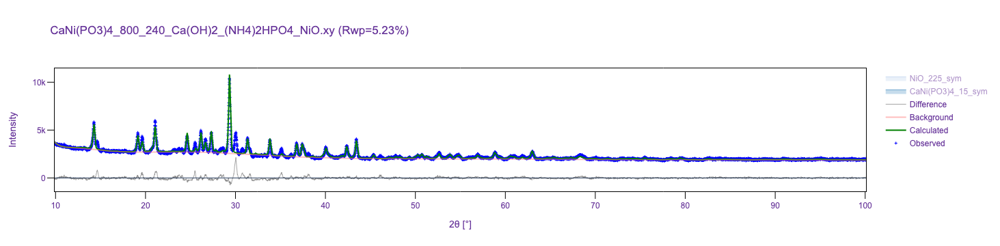

In [27]:
refinement.visualize()

## Example 2: Phase prediction and automated refinement

In [28]:
from dara.phase_prediction.predict import PhasePredictor
from pathlib import Path

import os

# os.environ["MP_API_KEY"] = **ADD YOUR API KEY**

PATH_TO_ICSD = Path("/Users/mcdermott/Documents/ICSD")  # provide a path to your local copy of the ICSD
predictor = PhasePredictor(
    PATH_TO_ICSD, max_rereact=5
)  # use lower max_rereact to generate less possible phases...

In [29]:
results = predictor.predict(["Bi2O3", "Fe2O3"])

2024-01-17 17:05:58,105 INFO dara.utils Downloading entries from Materials Project...


INFO:dara.utils:Downloading entries from Materials Project...


Retrieving ThermoDoc documents:   0%|          | 0/272 [00:00<?, ?it/s]

Enumerating reactions (BasicEnumerator): 100%|███████| 6/6 [00:00<00:00,  7.29it/s]
Building phase diagrams (MinimizeGibbsEnumerator): 100%|█| 4/4 [00:00<00:00, 737.33
Building chunks...: 100%|██████████████████████████| 4/4 [00:00<00:00, 1057.63it/s]
Enumerating reactions (MinimizeGibbsEnumerator): 100%|█| 1/1 [00:00<00:00, 82.97it/
Enumerating reactions (BasicEnumerator): 100%|███████| 6/6 [00:00<00:00, 19.58it/s]
Building phase diagrams (MinimizeGibbsEnumerator): 100%|█| 4/4 [00:00<00:00, 793.17
Building chunks...: 100%|██████████████████████████| 4/4 [00:00<00:00, 1012.14it/s]
Enumerating reactions (MinimizeGibbsEnumerator): 100%|█| 1/1 [00:00<00:00, 32.10it/
Filtering duplicates: 100%|█████████████████████| 10/10 [00:00<00:00, 11573.69it/s]


Now we write CIFs for the phases we expect to find in the sample. We will use the CIFs from the [ICSD](https://icsd.products.fiz-karlsruhe.de/) database:

In [35]:
predictor.write_cifs_from_formulas(results)

Skipping high-energy phase: 28622 (FeBiO3, 221): e_hull = 0.2553
Skipping high-energy phase: 676062 (FeBiO3, 221): e_hull = 0.2553
Skipping high-energy phase: 162834 (FeBiO3, 11): e_hull = 0.2566
Skipping high-energy phase: 168320 (FeBiO3, 8): e_hull = 0.4157
Skipping high-energy phase: 237537 (FeBiO3, 1): e_hull = 0.4379
Skipping high-energy phase: 192515 (FeBiO3, 9): e_hull = 1.6981
Copied 184771.cif to FeBiO3_161_(184771)-0.cif in cifs
Copied 154394.cif to FeBiO3_161_(154394)-0.cif in cifs
Copied 169800.cif to FeBiO3_161_(169800)-0.cif in cifs
Copied 237026.cif to FeBiO3_161_(237026)-0.cif in cifs
Copied 670588.cif to FeBiO3_161_(670588)-0.cif in cifs
Copied 168321.cif to FeBiO3_62_(168321)-12.cif in cifs
Copied 676060.cif to FeBiO3_62_(676060)-12.cif in cifs
Copied 188466.cif to FeBiO3_99_(188466)-27.cif in cifs
Copied 20618.cif to FeBiO3_160_(20618)-34.cif in cifs
Copied 164223.cif to FeBiO3_12_(164223)-56.cif in cifs
Copied 162264.cif to FeBiO3_146_(162264)-62.cif in cifs
Copied 

INFO:dara.phase_prediction.predict:Reached cost cutoff.


In [44]:
from dara.search.search_phase import search_phases

data = Path("tutorial_data")
cif_paths = list(Path("cifs").glob("*.cif"))

pattern_fn = Path("../tests/test_data/BiFeO3.xy").absolute()
print(pattern_fn)

results = search_phases(
    pattern_path=pattern_fn,
    cif_paths=cif_paths
) # will take 20-30 mins

# return the best combination of phases
best_result = min(results, key=lambda x: results[x].lst_data.rwp)

/Users/mcdermott/code/github/dara/notebooks/../tests/test_data/BiFeO3.xy


Refining single phases:   5%|█                      | 2/42 [00:01<00:25,  1.55it/s]/Users/mcdermott/miniconda3/envs/refinement/lib/python3.11/site-packages/pymatgen/io/cif.py:1221: UserWarning:

Issues encountered while parsing CIF: 2 fractional coordinates rounded to ideal values to avoid issues with finite precision.

Refining single phases:  62%|█████████████▌        | 26/42 [00:27<00:18,  1.18s/it]/Users/mcdermott/miniconda3/envs/refinement/lib/python3.11/site-packages/pymatgen/io/cif.py:1221: UserWarning:

Issues encountered while parsing CIF: 4 fractional coordinates rounded to ideal values to avoid issues with finite precision.

Refining single phases:  86%|██████████████████▊   | 36/42 [00:36<00:05,  1.13it/s]/Users/mcdermott/miniconda3/envs/refinement/lib/python3.11/site-packages/pymatgen/io/cif.py:1221: UserWarning:

Issues encountered while parsing CIF: 2 fractional coordinates rounded to ideal values to avoid issues with finite precision.

Refining single phases: 100%|█████

Rwp = 12.27%: FeBiO3_161_(184771)-0.cif 
Rwp = 11.22%: FeBiO3_161_(184771)-0.cif Fe4Bi2O9_55_(186440)-0.cif 
Rwp = 8.16%: FeBiO3_161_(184771)-0.cif Fe4Bi2O9_55_(186440)-0.cif FeBi25O39_197_(257493)-None.cif 
Rwp = 8.15%: FeBiO3_161_(184771)-0.cif Fe4Bi2O9_55_(186440)-0.cif FeBi25O39_197_(257493)-None.cif FeBiO3_146_(162264)-62.cif 
Rwp = 8.16%: FeBiO3_161_(184771)-0.cif Fe4Bi2O9_55_(186440)-0.cif FeBi25O39_197_(257493)-None.cif Bi2O3_14_(169686)-0.cif 


/Users/mcdermott/miniconda3/envs/refinement/lib/python3.11/site-packages/pymatgen/io/cif.py:1221: UserWarning:

Issues encountered while parsing CIF: 4 fractional coordinates rounded to ideal values to avoid issues with finite precision.



Rwp = 8.15%: FeBiO3_161_(184771)-0.cif Fe4Bi2O9_55_(186440)-0.cif FeBi25O39_197_(257493)-None.cif Bi2O3_164_(186365)-71.cif 
Rwp = 8.16%: FeBiO3_161_(184771)-0.cif Fe4Bi2O9_55_(186440)-0.cif FeBi25O39_197_(257493)-None.cif Fe2O3_166_(291494)-None.cif 
Rwp = 8.16%: FeBiO3_161_(184771)-0.cif Fe4Bi2O9_55_(186440)-0.cif FeBi25O39_197_(257493)-None.cif Fe2O3_19_(671713)-None.cif 
Rwp = 11.19%: FeBiO3_161_(184771)-0.cif Fe4Bi2O9_55_(186440)-0.cif FeBiO3_146_(162264)-62.cif 
Rwp = 8.97%: FeBiO3_161_(184771)-0.cif Fe4Bi2O9_55_(186440)-0.cif Bi2O3_115_(168808)-169.cif 
Rwp = 11.19%: FeBiO3_161_(184771)-0.cif Fe4Bi2O9_55_(186440)-0.cif Bi2O3_115_(168808)-169.cif FeBiO3_146_(162264)-62.cif 
Rwp = 10.31%: FeBiO3_161_(184771)-0.cif Fe4Bi2O9_55_(186440)-0.cif Bi2O3_115_(168808)-169.cif Bi2O3_14_(15752)-0.cif 


KeyboardInterrupt: 

In [41]:
best_refinement = results[best_result]

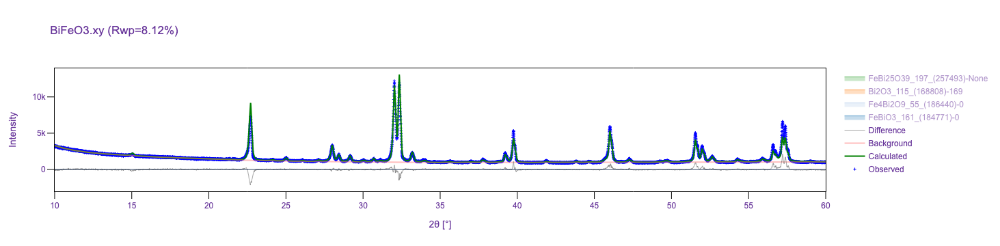

In [42]:
best_refinement.visualize()

In [43]:
best_refinement.get_phase_weights()

{'FeBiO3_161_(184771)-0': 0.7588473912435306,
 'Fe4Bi2O9_55_(186440)-0': 0.13442439502028256,
 'FeBi25O39_197_(257493)-None': 0.08952301021121836,
 'Bi2O3_115_(168808)-169': 0.017205203524968526}